In [3]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten,Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt

In [2]:
IMAGE_SIZE = [224, 224]

In [3]:
train_path ="C:/Users/91937/Downloads/train1"
test_path ="C:/Users/91937/Downloads/test1"
val_path ="C:/Users/91937/Downloads/validation1"

In [4]:
x_train=[]

for folder in os.listdir(train_path):
    sub_path=train_path+"/"+folder
    for img in os.listdir(sub_path):
        image_path=sub_path+"/"+img
        img_arr=cv2.imread(image_path)
        img_arr=cv2.resize(img_arr,(224,224))
        x_train.append(img_arr)

In [5]:
x_test=[]

for folder in os.listdir(test_path):
    sub_path=test_path+"/"+folder
    for img in os.listdir(sub_path):
        image_path=sub_path+"/"+img
        img_arr=cv2.imread(image_path)
        img_arr=cv2.resize(img_arr,(224,224))
        x_test.append(img_arr)

In [6]:
x_val=[]

for folder in os.listdir(val_path):
    sub_path=val_path+"/"+folder
    for img in os.listdir(sub_path):
        image_path=sub_path+"/"+img
        img_arr=cv2.imread(image_path)
        img_arr=cv2.resize(img_arr,(224,224))
        x_val.append(img_arr)

In [7]:
train_x=np.array(x_train)
test_x=np.array(x_test)
val_x=np.array(x_val)

In [8]:
train_x.shape,test_x.shape,val_x.shape


((1527, 224, 224, 3), (478, 224, 224, 3), (382, 224, 224, 3))

In [9]:

train_x=train_x/255.0
test_x=test_x/255.0
val_x=val_x/255.0

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [11]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                    horizontal_flip = True)

train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
val_datagen = ImageDataGenerator(rescale = 1./255)


training_set = train_datagen.flow_from_directory(train_path,
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'sparse')

test_set = test_datagen.flow_from_directory(test_path,
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'sparse')

val_set = val_datagen.flow_from_directory(val_path,
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'sparse')

Found 1527 images belonging to 5 classes.
Found 478 images belonging to 5 classes.
Found 382 images belonging to 5 classes.


In [12]:
training_set.class_indices


{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4}

In [13]:
train_y=training_set.classes


In [14]:
test_y=test_set.classes


In [15]:
val_y=val_set.classes


In [16]:
train_y.shape,test_y.shape,val_y.shape


((1527,), (478,), (382,))

In [17]:
vgg = VGG19(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)


In [18]:
# don't train existing weights
for layer in vgg.layers:
    layer.trainable = False

In [19]:
# our layers - you can add more if you want
x = Flatten()(vgg.output)

prediction = Dense(5, activation='softmax')(x)

In [20]:
# create a model object
model = Model(inputs=vgg.input, outputs=prediction)

# view the structure of the model
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [21]:
# tell the model what cost and optimization method to use
model.compile(
  loss='sparse_categorical_crossentropy',
  optimizer="adam",
  metrics=['accuracy']
)

In [22]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop=EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=5)

#Early stopping to avoid overfitting of model

In [23]:
history = model.fit(
  train_x,
  train_y,
  validation_data=(val_x,val_y),
  epochs=10,
  callbacks=[early_stop],
  batch_size=32,shuffle=True)

Epoch 1/10
48/48 [==============================] - 461s 10s/step - loss: 1.1663 - accuracy: 0.5521 - val_loss: 0.7513 - val_accuracy: 0.7304
Epoch 2/10
48/48 [==============================] - 424s 9s/step - loss: 0.4578 - accuracy: 0.8454 - val_loss: 0.6510 - val_accuracy: 0.7592
Epoch 3/10
48/48 [==============================] - 391s 8s/step - loss: 0.2893 - accuracy: 0.9181 - val_loss: 0.6279 - val_accuracy: 0.7330
Epoch 4/10
48/48 [==============================] - 393s 8s/step - loss: 0.1948 - accuracy: 0.9627 - val_loss: 0.5705 - val_accuracy: 0.7906
Epoch 5/10
48/48 [==============================] - 415s 9s/step - loss: 0.1430 - accuracy: 0.9764 - val_loss: 0.5694 - val_accuracy: 0.7853
Epoch 6/10
48/48 [==============================] - 433s 9s/step - loss: 0.1117 - accuracy: 0.9810 - val_loss: 0.6108 - val_accuracy: 0.7932
Epoch 7/10
48/48 [==============================] - 441s 9s/step - loss: 0.0973 - accuracy: 0.9869 - val_loss: 0.5463 - val_accuracy: 0.8272
Epoch 8/10
4

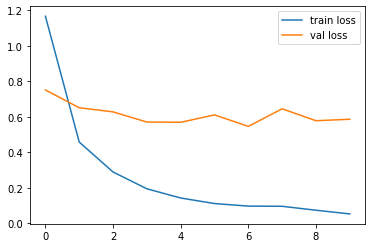

In [24]:
# loss
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.legend()

plt.savefig('vgg-loss-rps-1.png')
plt.show()

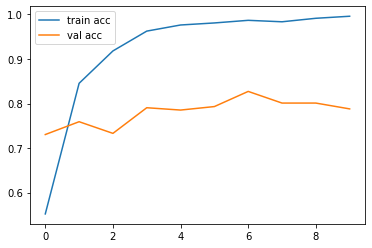

In [25]:
# accuracies
plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.legend()

plt.savefig('vgg-acc-rps-1.png')
plt.show()

In [26]:
model.evaluate(test_x,test_y,batch_size=32)


15/15 [==============================] - 89s 6s/step - loss: 0.4585 - accuracy: 0.8473


[0.4584597051143646, 0.8472803235054016]

In [27]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
import numpy as np

In [28]:

y_pred=model.predict(test_x)
y_pred=np.argmax(y_pred,axis=1)

In [29]:
accuracy_score(y_pred,test_y)


0.8472803347280334

In [30]:
print(classification_report(y_pred,test_y))


              precision    recall  f1-score   support

           0       0.83      0.94      0.88        71
           1       0.89      0.88      0.89       101
           2       0.85      0.78      0.81        90
           3       0.86      0.85      0.85       120
           4       0.80      0.80      0.80        96

    accuracy                           0.85       478
   macro avg       0.85      0.85      0.85       478
weighted avg       0.85      0.85      0.85       478



In [31]:
print(classification_report(y_pred,test_y))


              precision    recall  f1-score   support

           0       0.83      0.94      0.88        71
           1       0.89      0.88      0.89       101
           2       0.85      0.78      0.81        90
           3       0.86      0.85      0.85       120
           4       0.80      0.80      0.80        96

    accuracy                           0.85       478
   macro avg       0.85      0.85      0.85       478
weighted avg       0.85      0.85      0.85       478



In [32]:
confusion_matrix(y_pred,test_y)


array([[ 67,   0,   0,   4,   0],
       [  0,  89,   5,   1,   6],
       [  3,   4,  70,   6,   7],
       [  9,   1,   2, 102,   6],
       [  2,   6,   5,   6,  77]], dtype=int64)

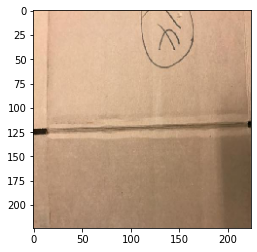

cardboard


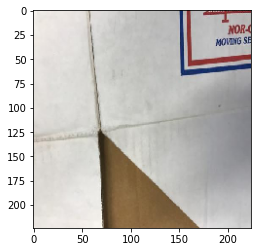

cardboard


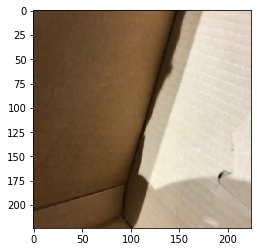

cardboard


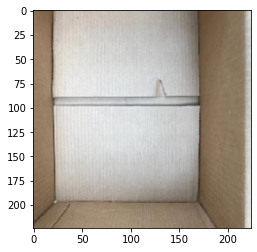

cardboard


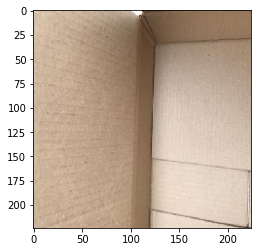

cardboard


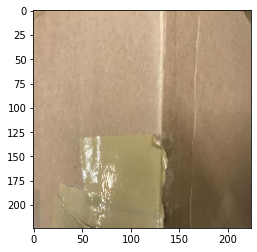

plastic


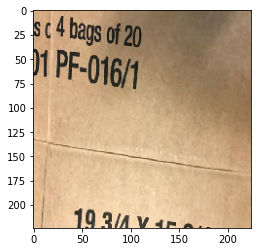

cardboard


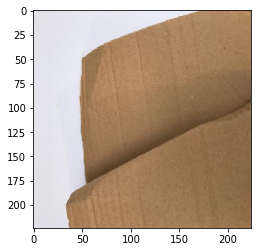

paper


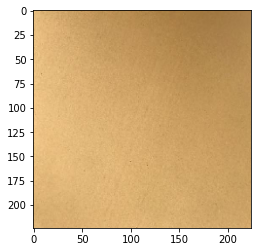

metal


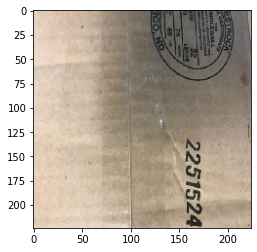

cardboard


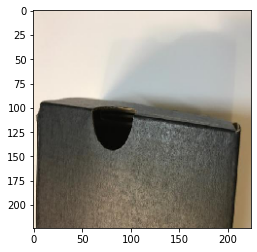

metal


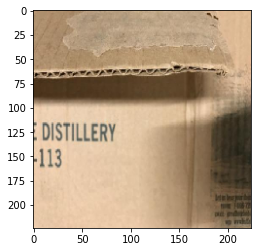

cardboard


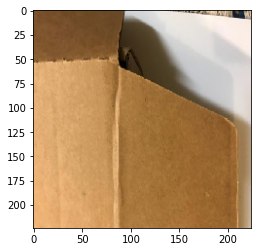

cardboard


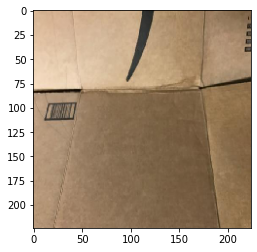

cardboard


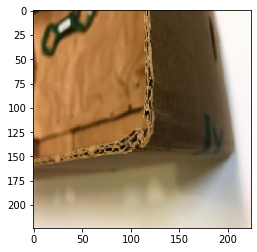

cardboard


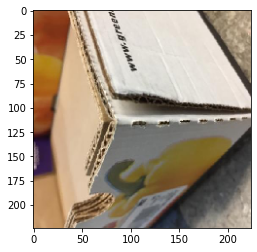

cardboard


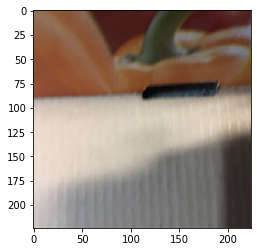

glass


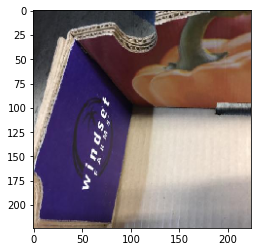

cardboard


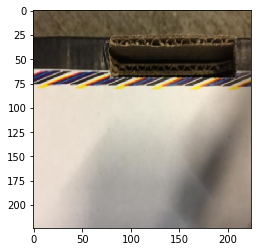

cardboard


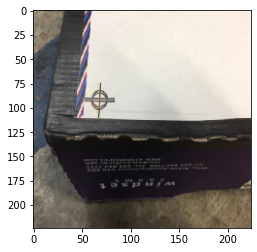

cardboard


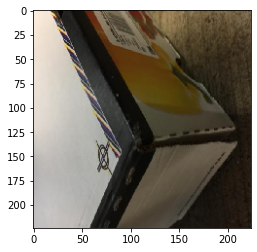

cardboard


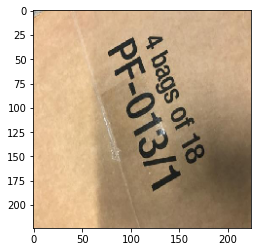

cardboard


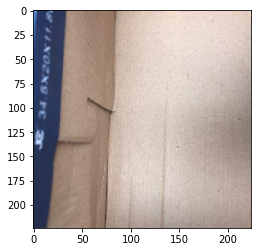

cardboard


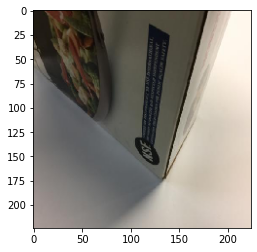

paper


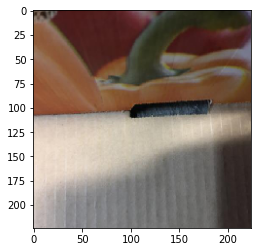

glass


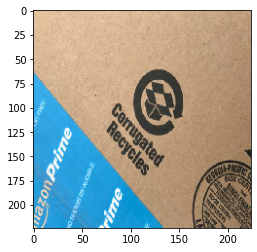

cardboard


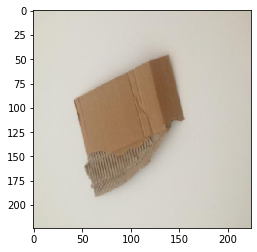

cardboard


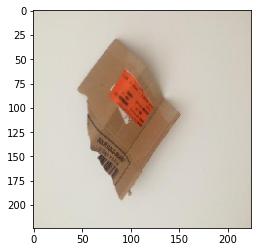

cardboard


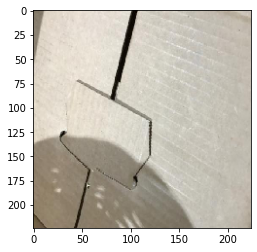

cardboard


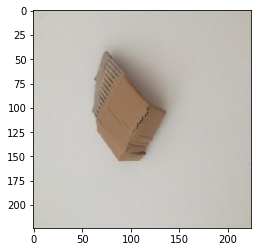

cardboard


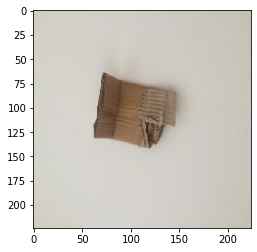

cardboard


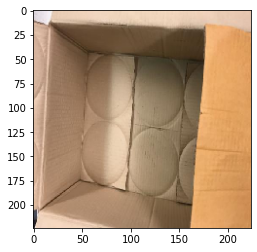

cardboard


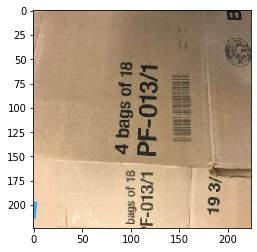

cardboard


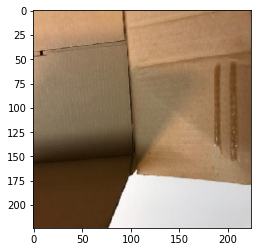

cardboard


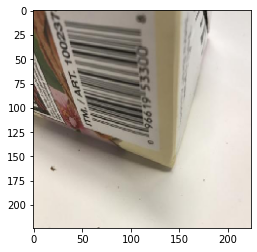

cardboard


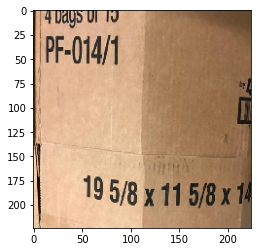

cardboard


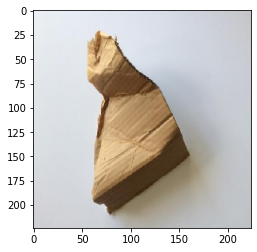

paper


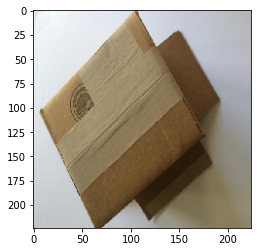

paper


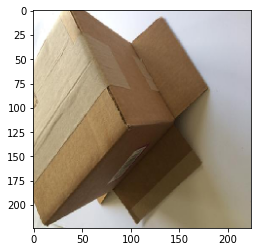

cardboard


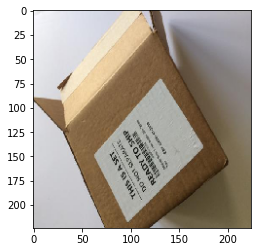

paper


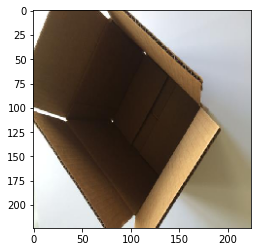

cardboard


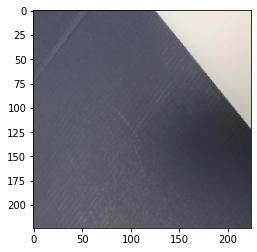

cardboard


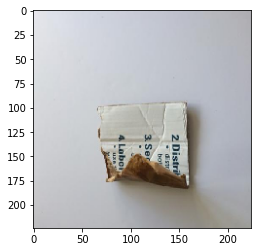

cardboard


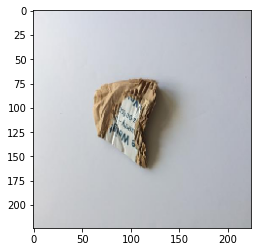

metal


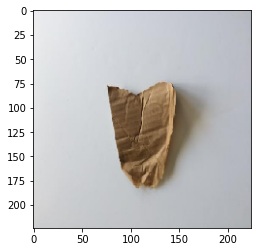

cardboard


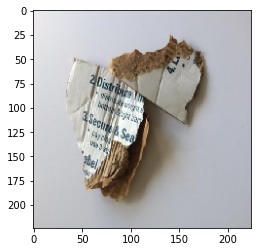

paper


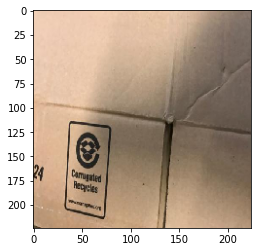

cardboard


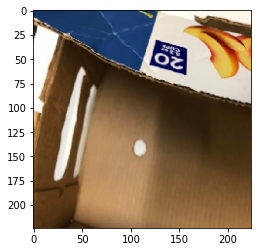

cardboard


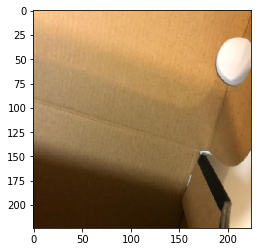

cardboard


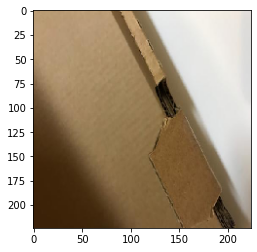

cardboard


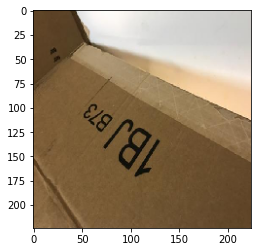

cardboard


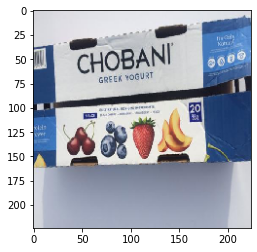

cardboard


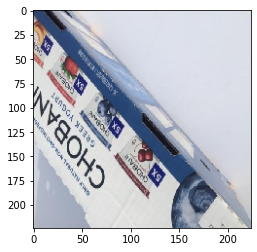

cardboard


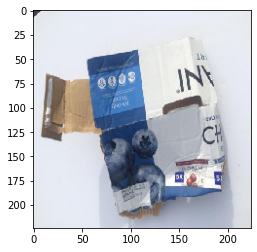

cardboard


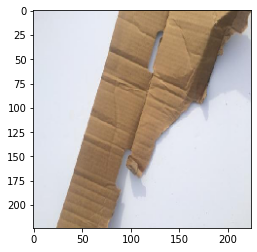

cardboard


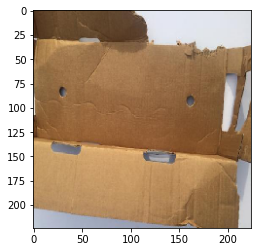

cardboard


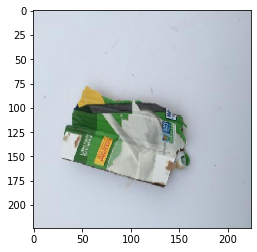

cardboard


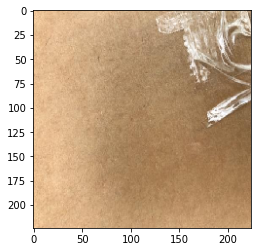

cardboard


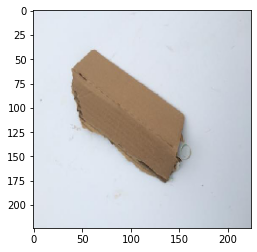

cardboard


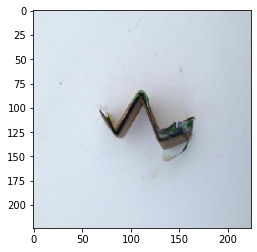

glass


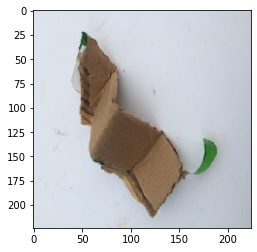

cardboard


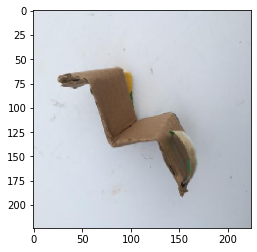

cardboard


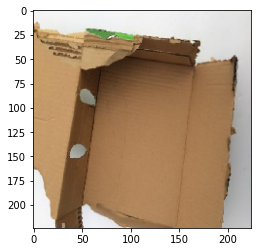

cardboard


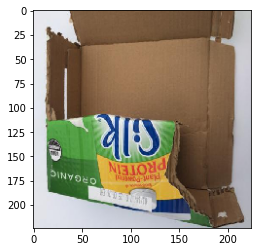

cardboard


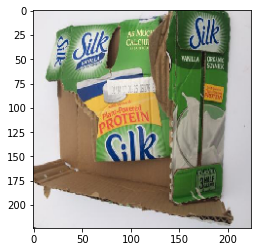

cardboard


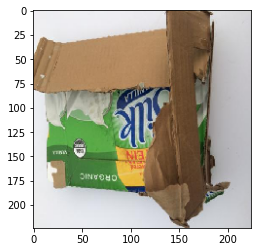

cardboard


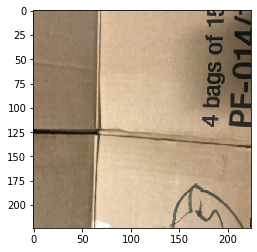

cardboard


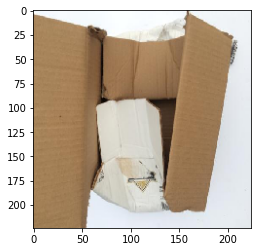

cardboard


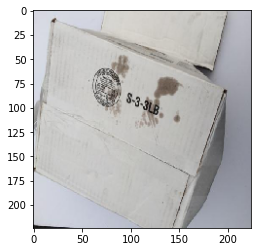

cardboard


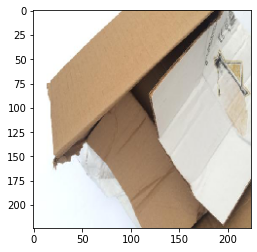

cardboard


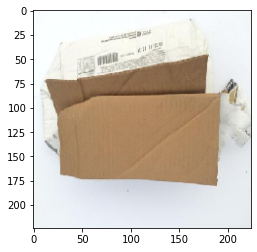

cardboard


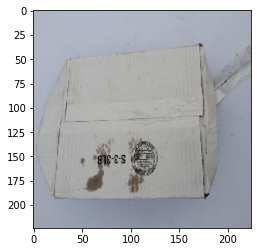

metal


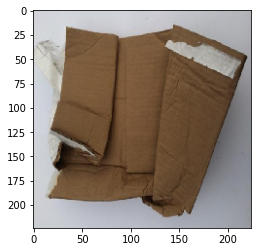

paper


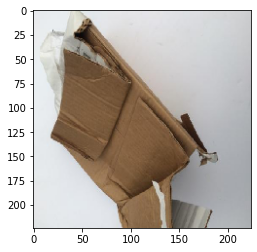

cardboard


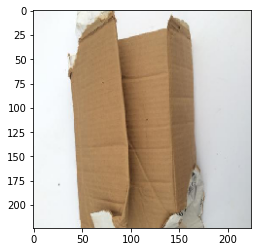

cardboard


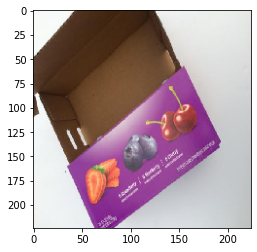

cardboard


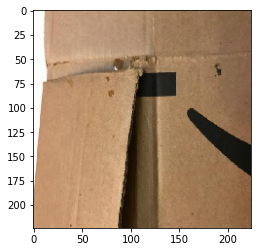

cardboard


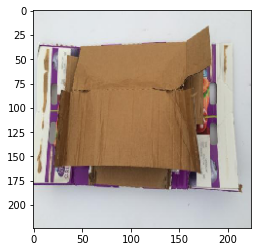

cardboard


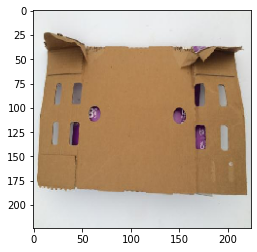

cardboard


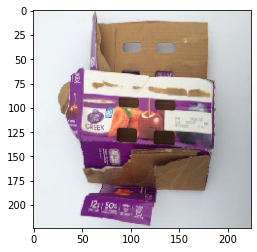

cardboard


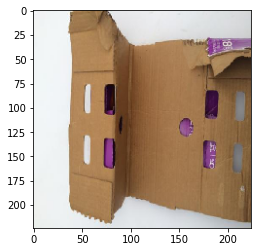

cardboard


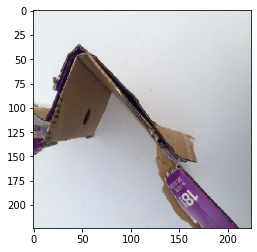

cardboard


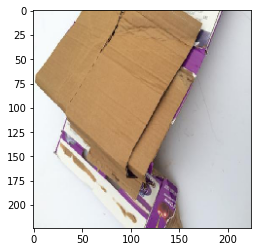

cardboard


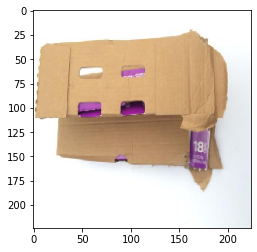

cardboard


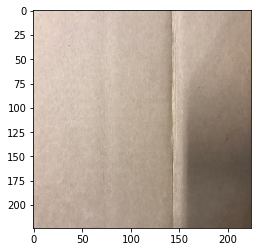

cardboard


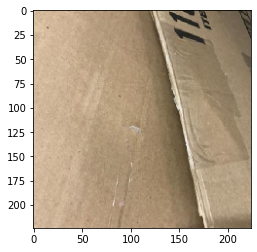

paper


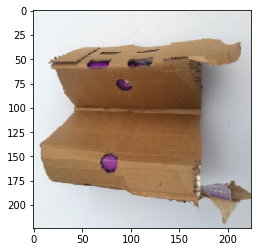

cardboard


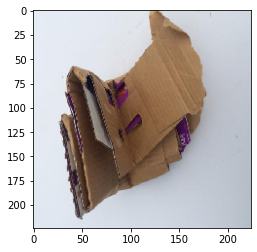

paper


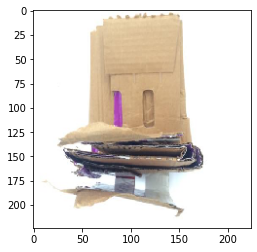

cardboard


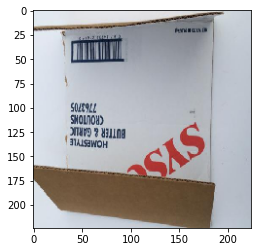

cardboard


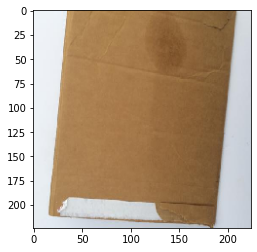

cardboard


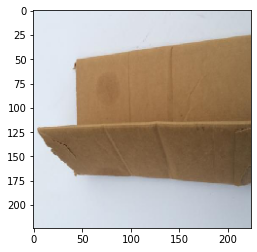

cardboard


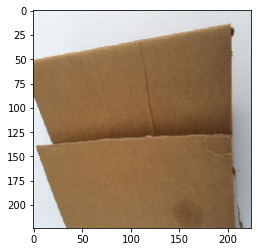

cardboard


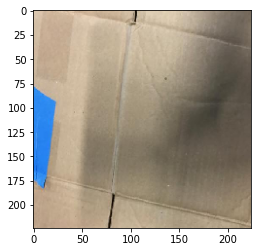

cardboard


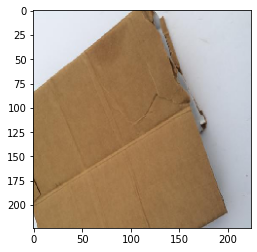

cardboard


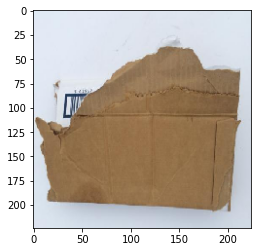

paper


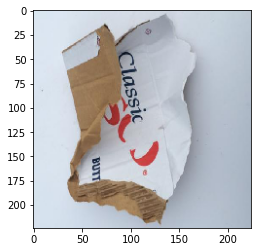

cardboard


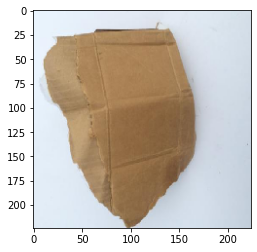

cardboard


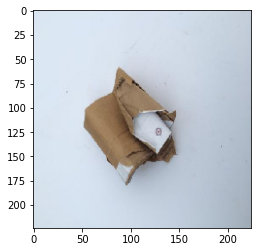

cardboard


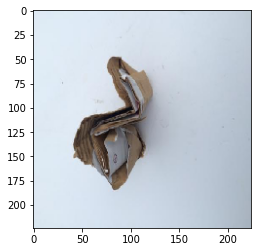

cardboard


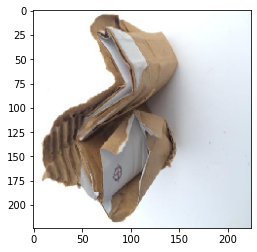

cardboard


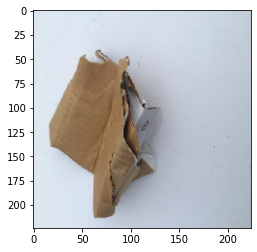

paper


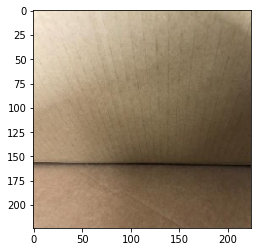

cardboard


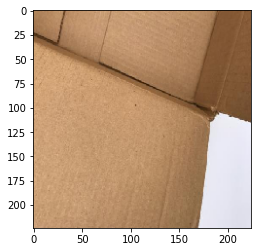

cardboard


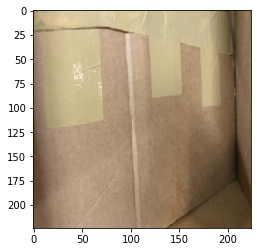

paper


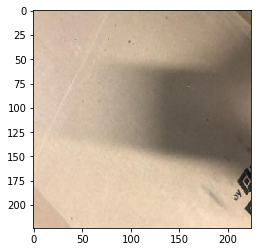

cardboard


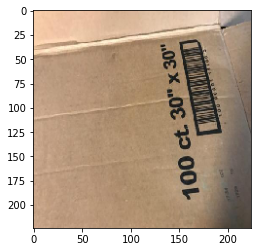

cardboard


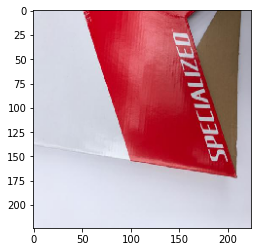

cardboard


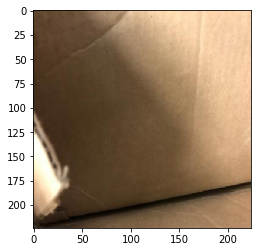

cardboard


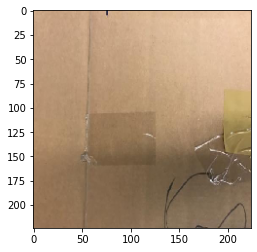

cardboard


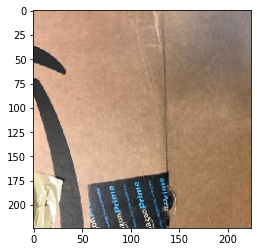

cardboard


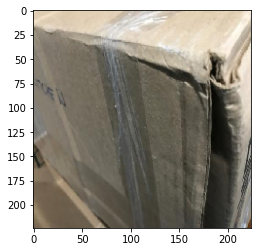

metal


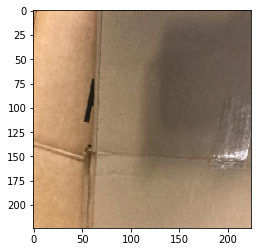

cardboard


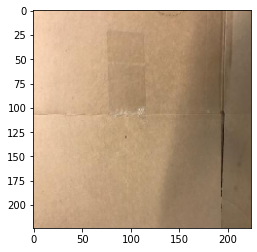

cardboard


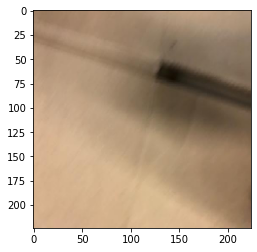

cardboard


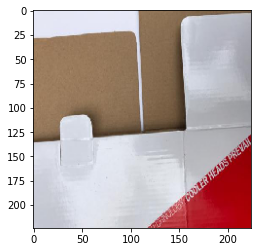

paper


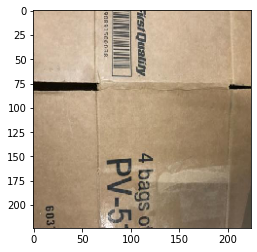

cardboard


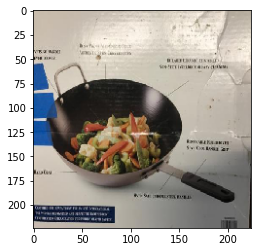

cardboard


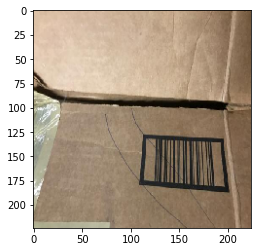

cardboard


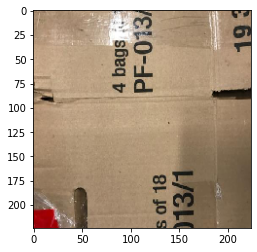

cardboard


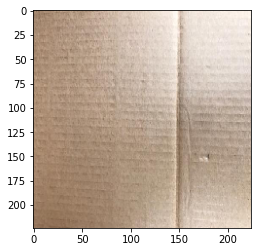

cardboard


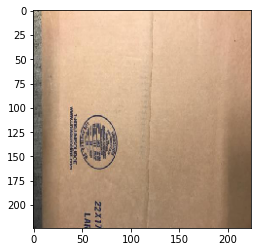

cardboard


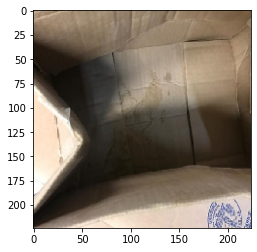

cardboard


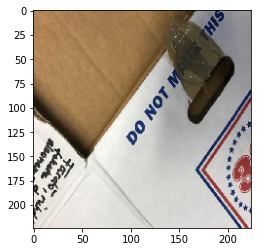

cardboard


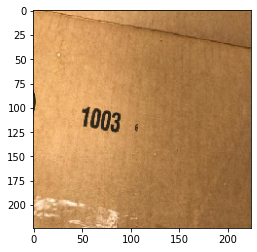

cardboard


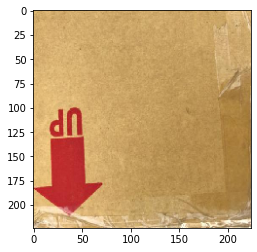

cardboard


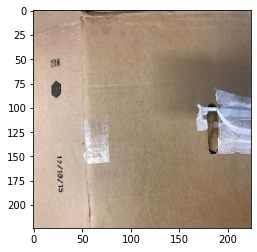

cardboard


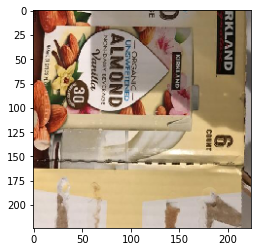

cardboard


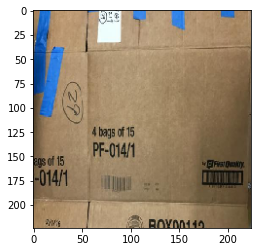

cardboard


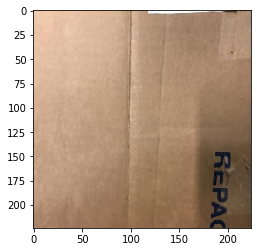

cardboard


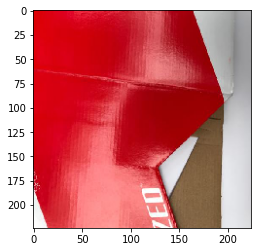

cardboard


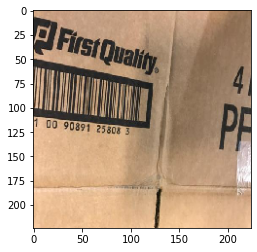

cardboard


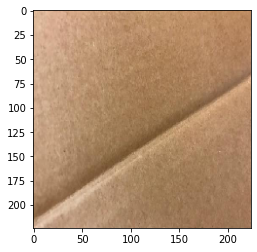

cardboard


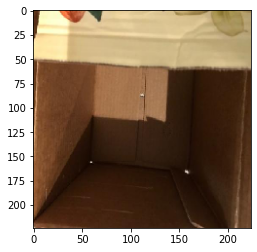

cardboard


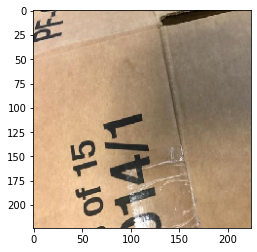

cardboard


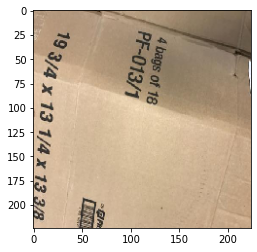

cardboard


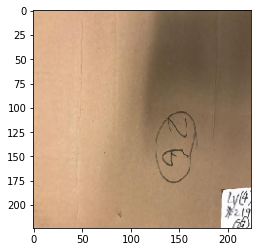

cardboard


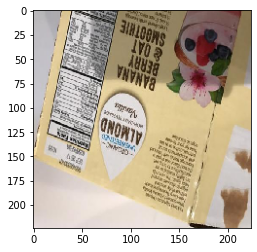

cardboard


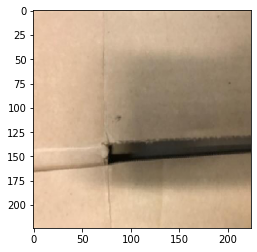

cardboard


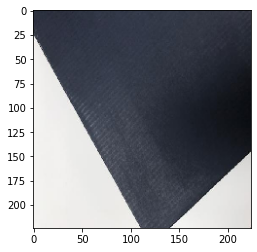

cardboard


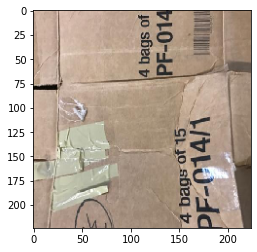

cardboard


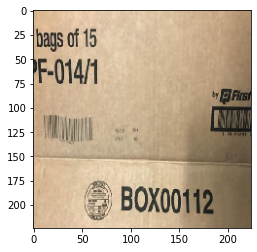

cardboard


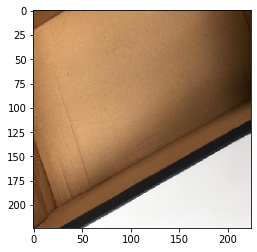

cardboard


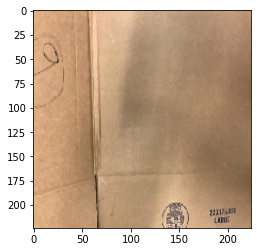

cardboard


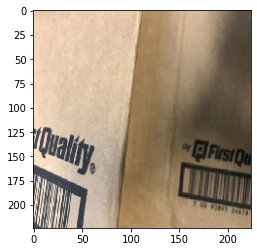

cardboard


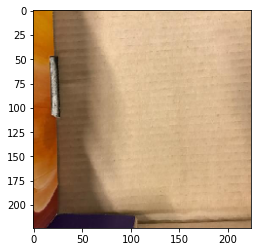

cardboard


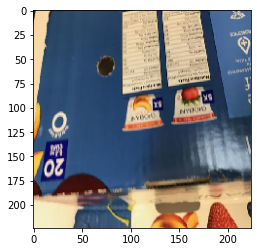

cardboard


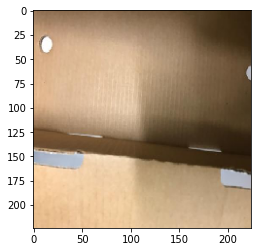

cardboard


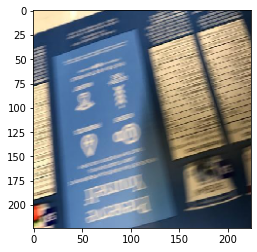

paper


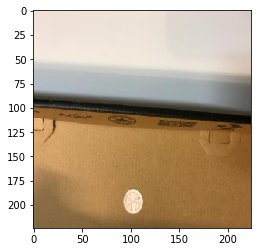

cardboard


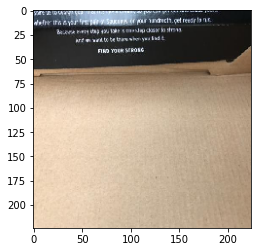

cardboard


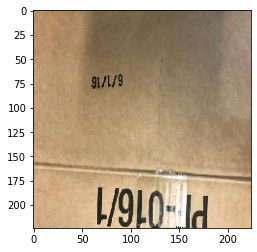

cardboard


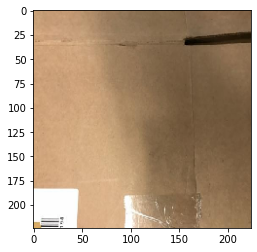

cardboard


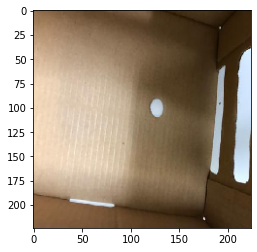

cardboard


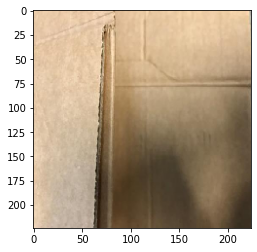

cardboard


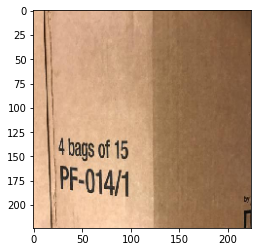

cardboard


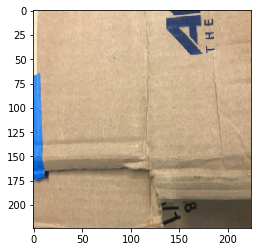

cardboard


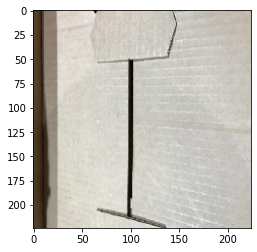

cardboard


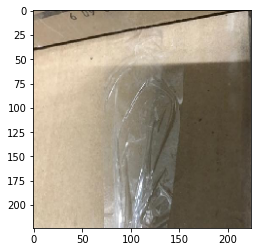

metal


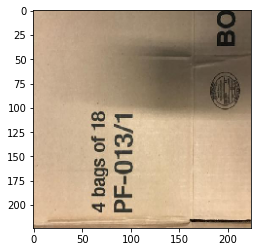

cardboard


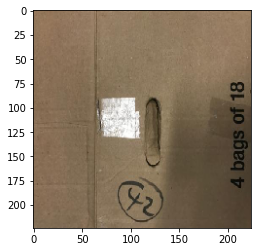

cardboard


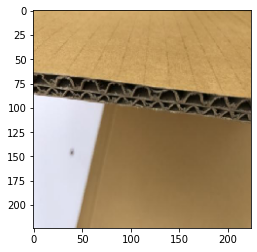

cardboard


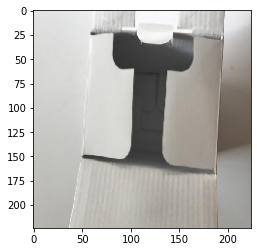

cardboard


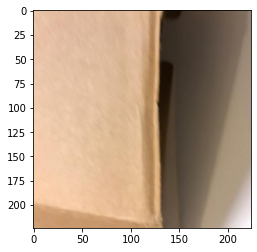

metal


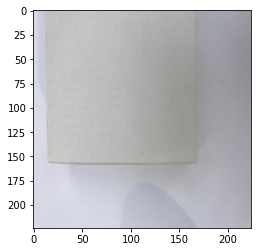

cardboard


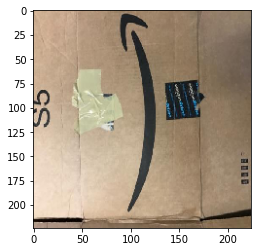

cardboard


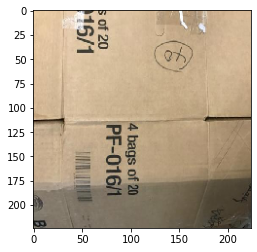

cardboard


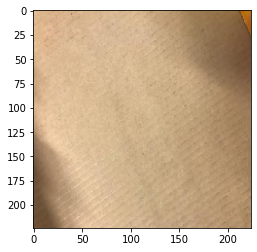

plastic


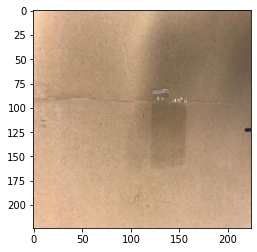

cardboard


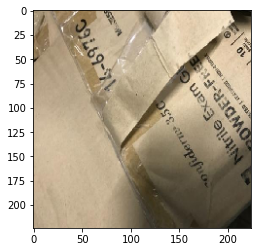

cardboard


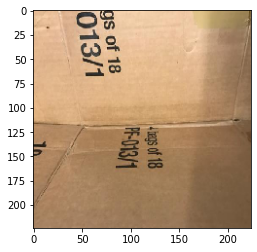

cardboard


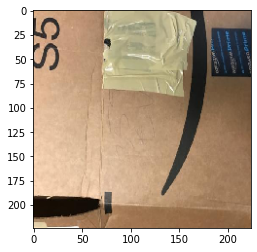

cardboard


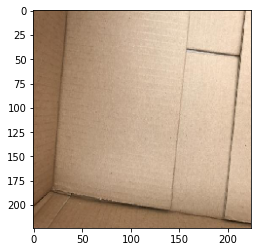

cardboard


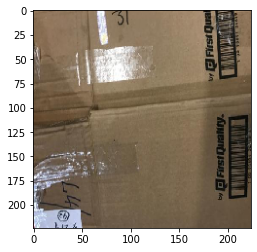

cardboard


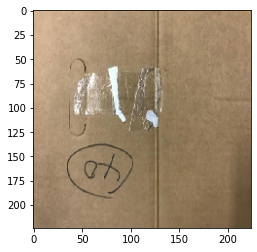

paper


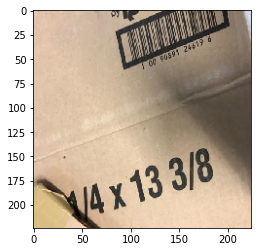

cardboard


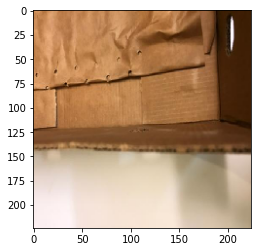

cardboard


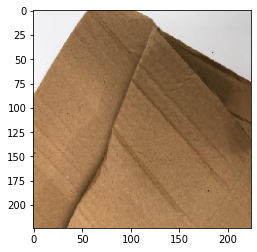

paper


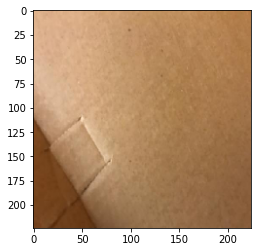

cardboard


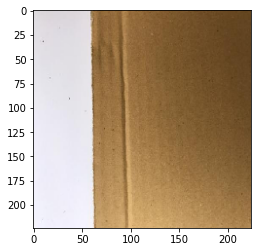

cardboard


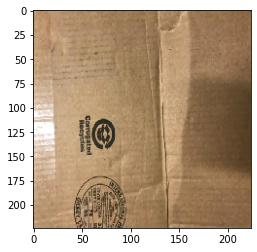

paper


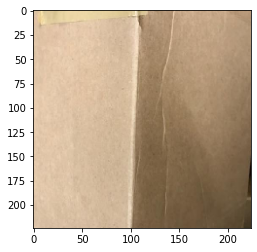

cardboard


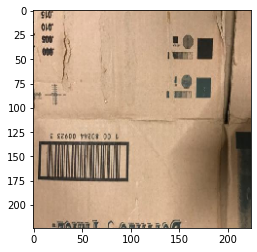

cardboard


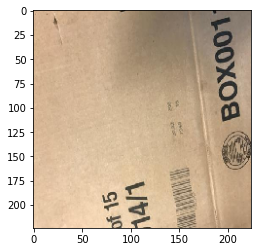

cardboard


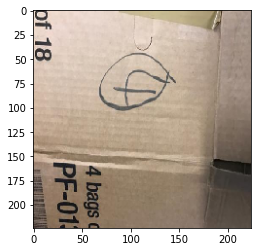

cardboard


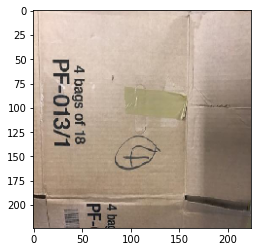

cardboard


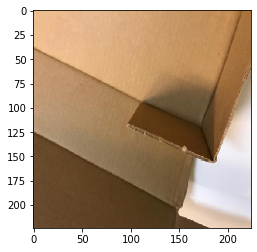

cardboard


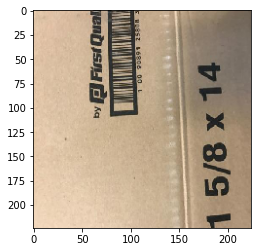

cardboard


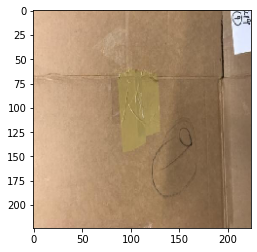

cardboard


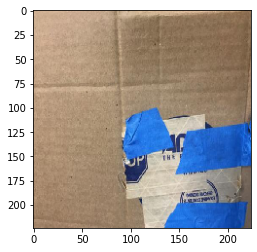

paper


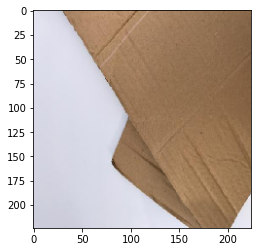

cardboard


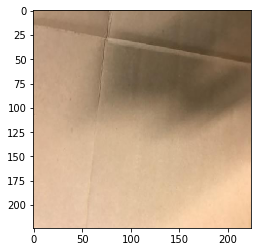

cardboard


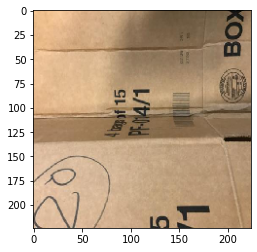

cardboard


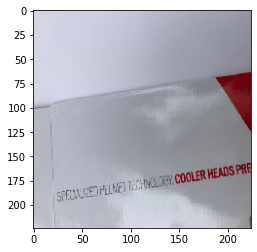

cardboard


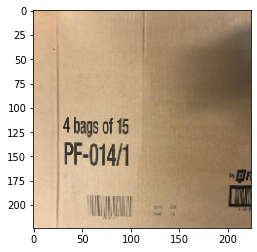

cardboard


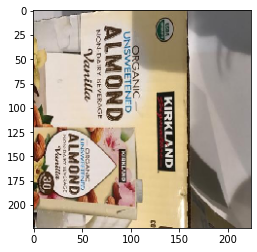

cardboard


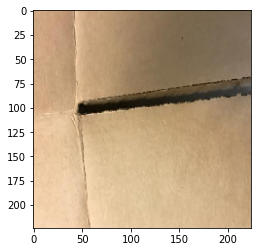

cardboard


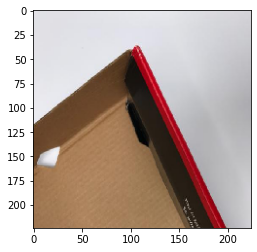

cardboard


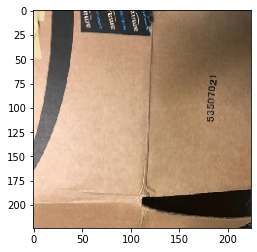

cardboard


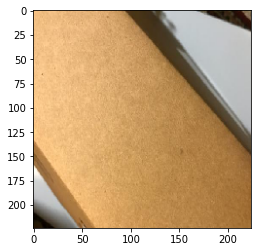

cardboard


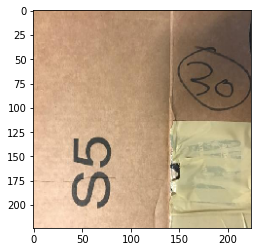

cardboard


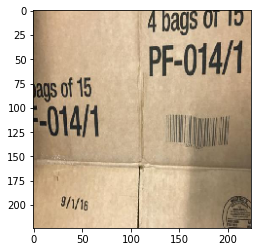

cardboard


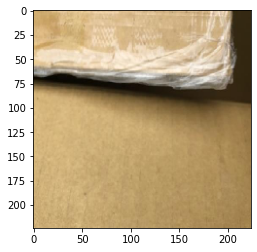

cardboard


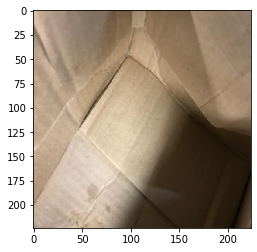

cardboard


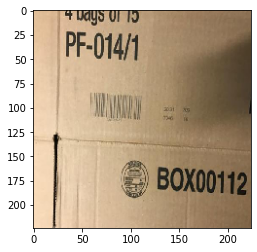

cardboard


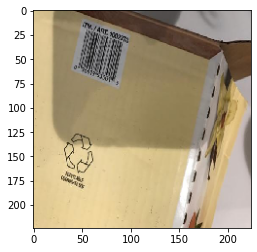

cardboard


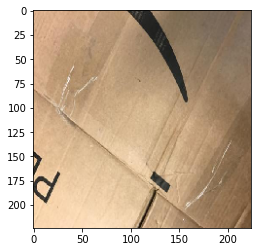

cardboard


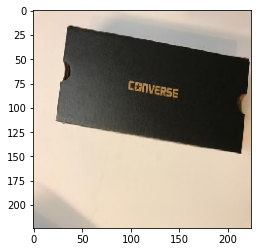

cardboard


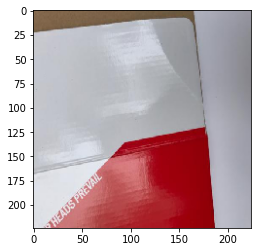

paper


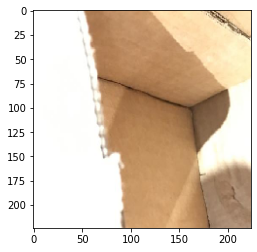

cardboard


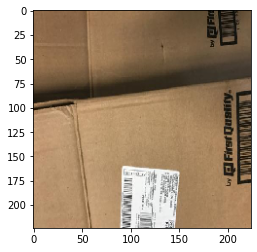

cardboard


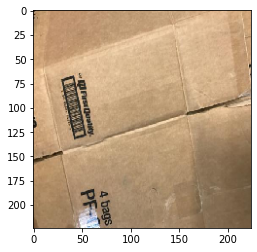

cardboard


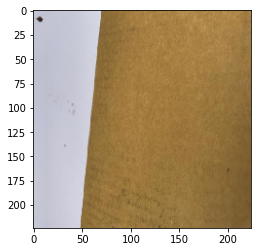

cardboard


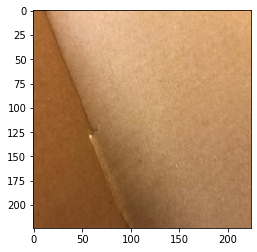

plastic


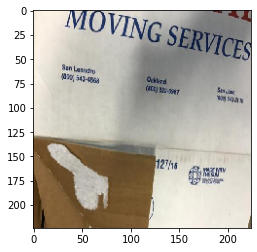

cardboard


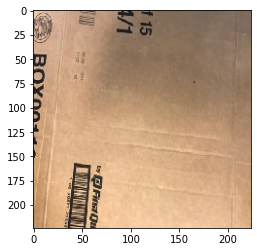

cardboard


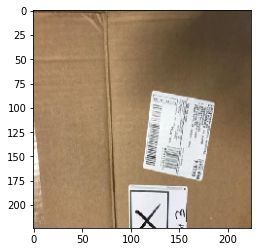

cardboard


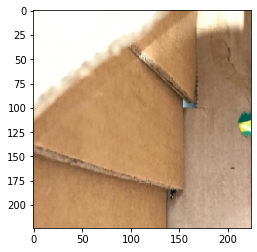

paper


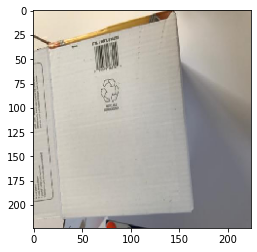

cardboard


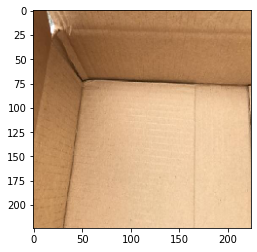

cardboard


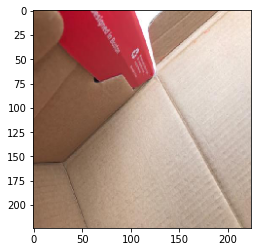

cardboard


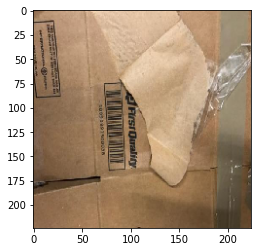

cardboard


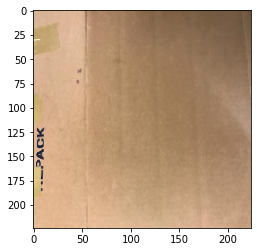

cardboard


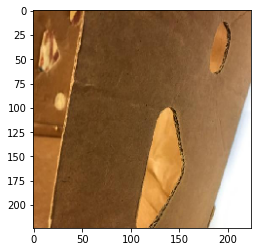

cardboard


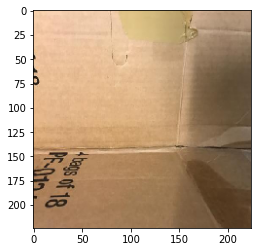

cardboard


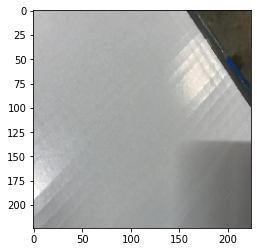

cardboard


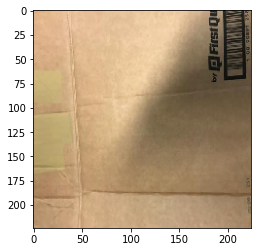

cardboard


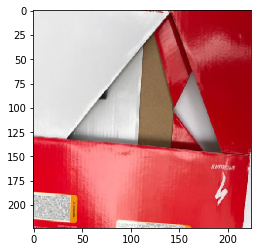

cardboard


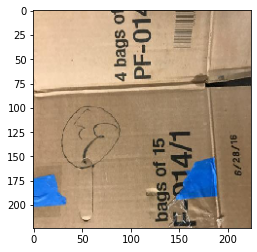

cardboard


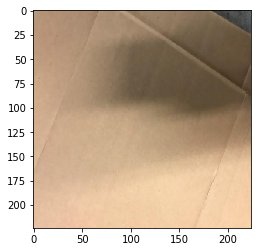

cardboard


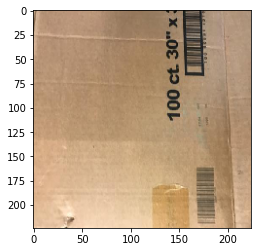

cardboard


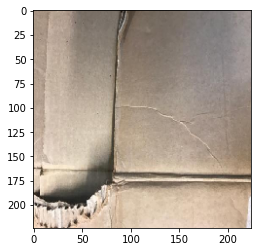

cardboard


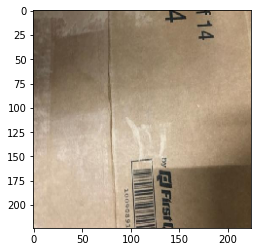

cardboard


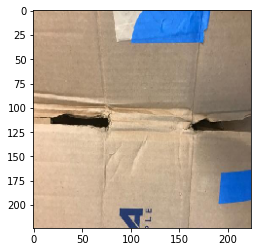

cardboard


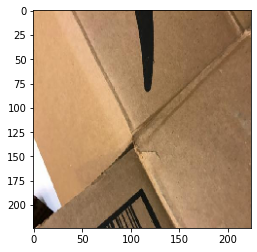

cardboard


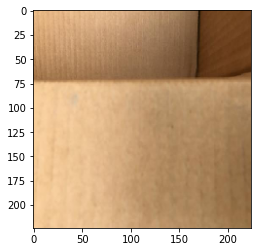

cardboard


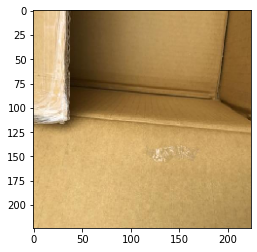

cardboard


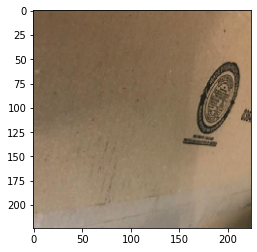

cardboard


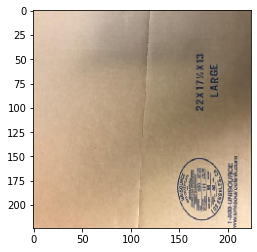

cardboard


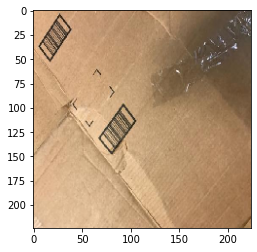

cardboard


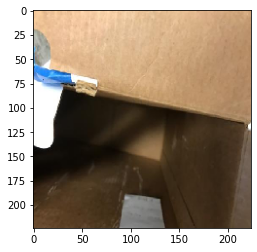

cardboard


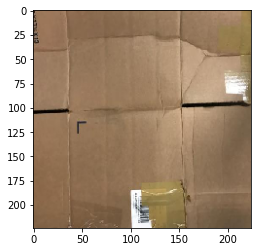

cardboard


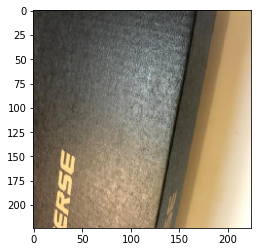

cardboard


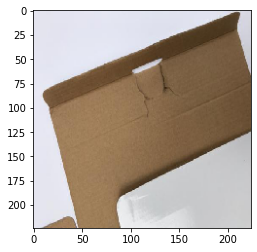

cardboard


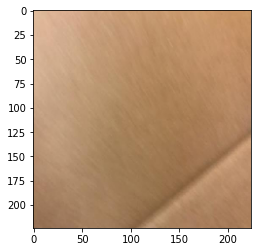

metal


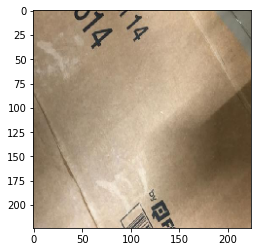

cardboard


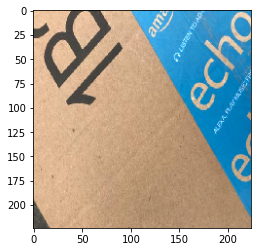

cardboard


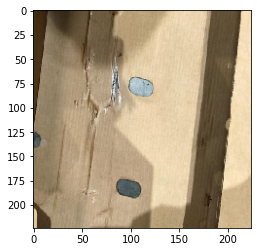

cardboard


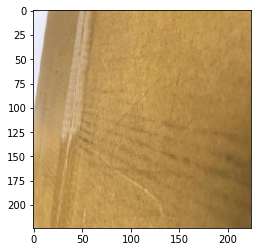

paper


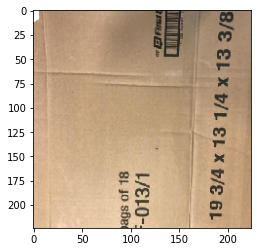

cardboard


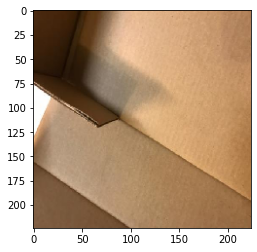

cardboard


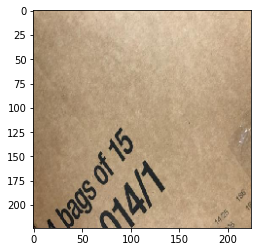

cardboard


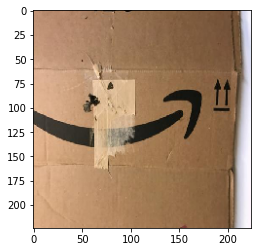

cardboard


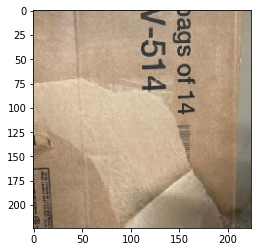

cardboard


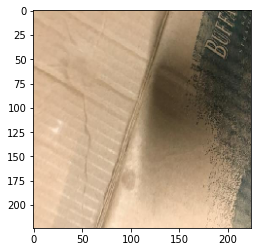

metal


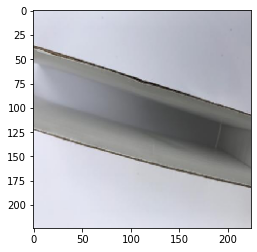

cardboard


In [36]:
path="C:/Users/91937/Downloads/train1/cardboard"
for img in os.listdir(path):
    img=image.load_img(path+"/"+img,target_size=(224,224))
    plt.imshow(img)
    plt.show()
    x=image.img_to_array(img)
    x=np.expand_dims(x,axis=0)
    images=np.vstack([x])
    pred=model.predict(images,batch_size=1) 
    if pred[0][0]>0.5:
        print("cardboard")
    elif pred[0][1]>0.5:
        print("glass")
    elif pred[0][2]>0.5:
        print("metal")
    elif pred[0][3]>0.5:
        print("paper")
    elif pred[0][4]>0.5:
        print("plastic")
    else:
        print("Unknown")

In [39]:
model.save("vgg-rps-final.h5")


In [41]:
model.save("vgg-rps-final.h5")


In [2]:
model.save("daku.h5")

NameError: name 'model' is not defined

In [40]:
model.save("C:\Users\91937\Downloads\class\vgg-rps-final.h5")


SyntaxError: (unicode error) 'unicodeescape' codec can't decode bytes in position 2-3: truncated \UXXXXXXXX escape (Temp/ipykernel_13736/2243544268.py, line 1)